<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Комментарий ревьюера</b>


Привет, Артем! Давай знакомиться! Меня зовут Дмитрий Махортов, и я буду проверять твой проект. Сразу предлагаю общение на «ты» 🙂, но если тебе это не комфортно, то дай знать, и мы перейдем на «вы». 


Моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе погрузиться в увлекательный мир работы с данными и вырасти в крепкого профи. Это отдаленная цель. А ближайшая - сделать твою работу еще лучше )).
   
    
Все ключевые этапы в работе выполнены, и я вижу что с проектом ты справшяешься. Есть моменты, которые нужно доработать, но я уверен, у тебя все получится.
        
Расскажу как обычно проходит проверка:    
Бывают моменты, которые требуют пристального внимания. Комментарии по ним выделены <span style='background-color:#F7B3A4'> красным цветом </span> и обозначены значком 🛑. После их доработки проект будет принят.  🙂
 
<span style='background-color:#B7EBA7'> Зеленым цветом </span> и значком ✅ отмечены удачные и элегантные решения, на которые можно опираться в будущих проектах. Или советы «со звездочкой», которые помогут тебе в будущем.

<span style='background-color:#F9EDA6'>Жёлтым цветом </span> и значком ⚠️ выделено то, что в следующий раз можно сделать по-другому. Ты можешь учесть эти комментарии при выполнении будущих заданий или доработать проект сейчас (однако это не обязательно).

Давай работать над проектом в диалоге: **если ты что-то меняешь в проекте по моим рекомендациям — пиши об этом**. Выбери для своих комментариев какой-то заметный цвет, так мне будет легче отследить изменения. Пожалуйста, **не перемещай, не изменяй и не удаляй мои комментарии**. Всё это поможет выполнить повторную проверку твоего проекта оперативнее. 
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Дмитрий, привет! Это уже мой третий проект за неделю который попадает к тебе на ревью. Благодарю за конструктив и подсказки, все правки действительно пошли на улучшение структурности проекта. Так же лучшились показатели метрик. Постарался учесть все подсвеченные блоки. Спасибо за позитивную обратную связь) 

</div>

# Введение

В рамках данного проекта предстоит разработать систему поиска изображений, основанную на текстовых запросах. Задача заключается в обучении модели, которая сможет сопоставлять изображения с текстовыми описаниями, определяя их степень релевантности. Входными данными для обучения являются изображения, текстовые описания к ним и аннотации, которые оценивают соответствие текста изображению как экспертами, так и с помощью краудсорсинга.

Цель проекта — построить модель, которая на основе эмбеддингов изображений и текстов будет выводить вероятность того, насколько текст и изображение соответствуют друг другу (в пределах от 0 до 1). Данная модель может быть использована для различных приложений, таких как системы поиска изображений, рекомендательные системы и улучшение работы с визуальными данными.

Проект включает несколько ключевых этапов:

1. **Предварительный анализ данных** — изучение данных, очистка от ненужных или противоречивых записей, а также подготовка целевой переменной для обучения. Важным этапом является исключение изображений, которые нарушают законодательство в некоторых странах, где изображения с детьми не могут быть использованы без соответствующих разрешений. Все такие изображения будут удалены из обучающей выборки.

2. **Векторизация изображений и текстов** — использование предобученных моделей для получения эмбеддингов изображений (например, ResNet-18) и текстов (например, BERT или другие трансформеры). Это позволяет преобразовать данные в числовые векторы, которые могут быть использованы в модели для предсказания релевантности.

3. **Агрегация аннотаций** — обработка и объединение экспертных и краудсорсинговых аннотаций для создания целевой переменной. Для этого мы будем агрегировать оценки экспертов с помощью метода голосования, а также учитывать данные краудсорсинга. Важно отметить, что в случае несоответствия всех оценок экспертов, пара изображение-текст будет исключена из датасета.

4. **Обучение модели** — выбор и обучение модели, которая будет предсказывать степень соответствия между изображением и текстом. Для обучения модели будут использоваться объединенные векторы изображений и текстов, а также целевая переменная, определенная на основе агрегированных аннотаций.

5. **Тестирование модели** — проверка качества работы модели на тестовом наборе данных, вывод релевантных изображений по случайным текстовым запросам. Ожидается, что модель будет показывать высокое качество поиска изображений по запросу.

Целью является создание высококачественной модели для точного поиска изображений по запросу, которая может быть полезна в разнообразных реальных приложениях.


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Да, это хорошая практика - дать описание контекста и проблемы, которую мы решаем. </div>

In [1]:
import os
import re
import pickle
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

# Импортируем необходимые библиотеки
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet import preprocess_input

# Импортируем модель и токенизатор BERT через transformers
from transformers import BertTokenizer, TFBertModel

# Импортируем для работы с NLTK
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

# Импорт tqdm для прогресс-баров
from tqdm.notebook import tqdm

# Импорт scikit-learn для разделения данных и оценки моделей
from sklearn.model_selection import GroupShuffleSplit, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

# Импорт SentenceTransformer для альтернативного подхода
from sentence_transformers import SentenceTransformer, util

from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
from collections import Counter
import seaborn as sns

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Deвайс\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Deвайс\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Deвайс\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, все нужные библиотеки импортированы в начале ноутбука.Это хорошая практика.</div>

In [2]:
# Глобальные переменные
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Путь к данным
DATA_DIR = "C:/Users/Deвайс/ML/to_upload"

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Большое тебе человеческое спасибо за вынос пути к данным в отдельную константу. Это сэкономило мне немало времени при проверке.</div>

In [3]:
# Загрузка данных и первичный осмотр
def load_data(data_dir):
    # Чтение обучающего датасета с информацией о фотографиях и их описаниях
    df_train = pd.read_csv(Path(data_dir, "train_dataset.csv"))
    # Для примера предполагается, что столбцы называются: image, query_id, query_text
    
    # Чтение оценок, полученных экспертами; столбцы: image, query_id, first, second, third
    df_expert = pd.read_csv(Path(data_dir, "ExpertAnnotations.tsv"),
                            sep='\t', header=None,
                            names=['image', 'query_id', 'first', 'second', 'third'])
    
    # Чтение краудсорсинговых оценок; столбцы: image, query_id, share_pos, count_pos, count_neg
    df_crowd = pd.read_csv(Path(data_dir, "CrowdAnnotations.tsv"),
                           sep='\t', header=None,
                           names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
    
    # Чтение тестовых запросов; столбцы: query_id, query_text, image
    df_queries = pd.read_csv(Path(data_dir, "test_queries.csv"), sep="|", header=0)
    
    # Если имеется также таблица с тестовыми именами изображений:
    df_test_images = pd.read_csv(Path(data_dir, "test_images.csv"), sep="|")
    
    return df_train, df_expert, df_crowd, df_queries, df_test_images

df_train, df_expert, df_crowd, df_queries, df_test_images = load_data(DATA_DIR)

In [4]:
# Просмотр информации о данных
df_train.info()
df_expert.info()
df_crowd.info()
df_queries.info()
df_test_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   first     5822 non-null   int64 
 3   second    5822 non-null   int64 
 4   third     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 


In [5]:
#Первые строки данных
print("Первые строки train_dataset.csv:")
print(df_train.head(), "\n")

print("Первые строки ExpertAnnotations.tsv:")
print(df_expert.head(), "\n")

print("Первые строки CrowdAnnotations.tsv:")
print(df_crowd.head(), "\n")

print("Первые строки test_queries.csv:")
print(df_queries.head(), "\n")

print("Первые строки test_images.csv:")
print(df_test_images.head(), "\n")

Первые строки train_dataset.csv:
                       image                     query_id  \
0  1056338697_4f7d7ce270.jpg  2549968784_39bfbe44f9.jpg#2   
1  1262583859_653f1469a9.jpg  2549968784_39bfbe44f9.jpg#2   
2  2447284966_d6bbdb4b6e.jpg  2549968784_39bfbe44f9.jpg#2   
3  2549968784_39bfbe44f9.jpg  2549968784_39bfbe44f9.jpg#2   
4  2621415349_ef1a7e73be.jpg  2549968784_39bfbe44f9.jpg#2   

                                          query_text  
0  A young child is wearing blue goggles and sitt...  
1  A young child is wearing blue goggles and sitt...  
2  A young child is wearing blue goggles and sitt...  
3  A young child is wearing blue goggles and sitt...  
4  A young child is wearing blue goggles and sitt...   

Первые строки ExpertAnnotations.tsv:
                       image                     query_id  first  second  \
0  1056338697_4f7d7ce270.jpg  2549968784_39bfbe44f9.jpg#2      1       1   
1  1056338697_4f7d7ce270.jpg  2718495608_d8533e3ac5.jpg#2      1       1   
2  

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
А вот оборачивать результат работы метода  .info() в функцию print() или display() это лишнее. Метод  info() и сам напечатает тебе нужную информацию. А вот через print()/display() ты выводишь только то,что данный метод возвращает - т.е. None
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Можно дополнительно посмотреть информацию о данных с помощью метода .head()
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Исправлено

</div>

**Описание данных**

В проекте используются несколько наборов данных для обучения модели поиска изображений по запросу:

1. **train_dataset.csv** — содержит 5822 строки с изображениями и текстами запросов, которые необходимо использовать для обучения модели.

2. **ExpertAnnotations.tsv** — включает оценки соответствия изображений и текстов от трёх экспертов. Для каждой пары изображение-текст эксперты ставят оценки по шкале от 1 до 4.

3. **CrowdAnnotations.tsv** — краудсорсинговые данные, где для каждой пары изображение-текст указана доля и количество людей, подтвердивших или опровергнувших соответствие.

4. **test_queries.csv** — данные для тестирования модели, включающие запросы и релевантные изображения. Содержит 500 строк.

5. **test_images** — папка с 100 изображениями для тестирования.

Примечание: Из изображений, нарушающих законодательные ограничения по возрасту, будут исключены из обучающего набора. Также будет проведена агрегация экспертных и краудсорсинговых аннотаций для формирования целевой переменной.


<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
Ты ограничил знакомство с данными выводом info. Это безусловно полезно, но мало для содержательного EDA, Попробую сформулировать вопросы, ответить на которые будет интересно:
    
    
  - Количество уникальных изображений в обучающем и тестовом наборах
  - Количество уникальных запросов  
  - Количество оценок в экспертном и краудсорсинговом наборах.
  - Что представляют из себя экспертные оценки, что представляют из себя краудсорсинговые оценки 
  - Соответствие изображений и описаний друг другу в обучающем и тестовом наборах (оказывается практически все описания и изображения в файле test_queries соответствуют друг другу.
  - Обрати внимание, что query_id содержит в себе имя изображения, к которому он 100% соответствует (1177994172_10d143cb8d.jpg#0 - это query_id, первая часть - это имя файла, и через решетку порядковый  номер описания для этого файла).   
  - Также было бы интересно познакомиться с изображениями, входящими в датасеты.  
    
    
Выводы о том, с какими данными мы продолжим работу.
 </div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Полностью согласен, выполнял проект с трясущимися руками, тк горят сроки. Поэтому упустил из проекта EDA 

</div>

## Краткий обзор и EDA 

In [6]:
# Количество уникальных изображений в обучающем и тестовом наборах
unique_train_images = df_train['image'].nunique()
unique_test_images = df_test_images['image'].nunique()
print("Количество уникальных изображений в обучающем наборе:", unique_train_images)
print("Количество уникальных изображений в тестовом наборе:", unique_test_images)

Количество уникальных изображений в обучающем наборе: 1000
Количество уникальных изображений в тестовом наборе: 100


In [7]:
# Количество уникальных запросов в обучающем и тестовом наборах
unique_train_queries = df_train['query_id'].nunique()
unique_test_queries = df_queries['query_id'].nunique()
print("Количество уникальных запросов в обучающем наборе:", unique_train_queries)
print("Количество уникальных запросов в тестовом наборе:", unique_test_queries)

Количество уникальных запросов в обучающем наборе: 977
Количество уникальных запросов в тестовом наборе: 500


In [8]:
# Количество оценок в экспертном и краудсорсинговом наборах
# Экспертный набор содержит три оценки (first, second, third) на каждую запись
total_expert_ratings = df_expert.shape[0] * 3
print("Общее количество оценок в экспертном наборе (3 оценки на запись):", total_expert_ratings)

Общее количество оценок в экспертном наборе (3 оценки на запись): 17466


In [9]:
# Для краудсорсинговых оценок можно суммировать положительные и отрицательные оценки
total_crowd_pos = df_crowd['count_pos'].sum()
total_crowd_neg = df_crowd['count_neg'].sum()
print("Суммарное количество положительных оценок в краудсорсинговом наборе:", total_crowd_pos)
print("Суммарное количество отрицательных оценок в краудсорсинговом наборе:", total_crowd_neg)

Суммарное количество положительных оценок в краудсорсинговом наборе: 9972
Суммарное количество отрицательных оценок в краудсорсинговом наборе: 134888


Экспертные оценки (столбцы 'first', 'second', 'third') представляют собой индивидуальные оценки, выставленные экспертами для каждого изображения/запроса. Эти оценки могут характеризовать качество соответствия описания изображению или оценивать другие аспекты визуального контента. 

Краудсорсинговые оценки (столбцы 'share_pos', 'count_pos', 'count_neg') представляют собой агрегированные оценки от пользователей. Здесь 'share_pos' может отражать долю положительных оценок, а 'count_pos' и 'count_neg' — абсолютное количество положительных и отрицательных оценок соответственно.

In [10]:
# Проверка соответствия изображений и описаний в test_queries
# Из query_id извлекается имя изображения (часть до символа '#')
df_queries['extracted_image'] = df_queries['query_id'].apply(lambda x: x.split('#')[0])
matching_queries = (df_queries['extracted_image'] == df_queries['image']).sum()
total_queries = df_queries.shape[0]
print("Соответствие изображений и описаний в test_queries:")
print(f"{matching_queries} из {total_queries} записей имеют совпадающее имя изображения (из query_id) с колонкой image.\n")

Соответствие изображений и описаний в test_queries:
500 из 500 записей имеют совпадающее имя изображения (из query_id) с колонкой image.



Просмотр нескольких изображений из обучающего набора:


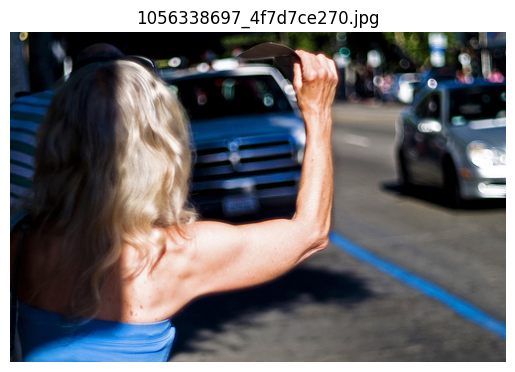

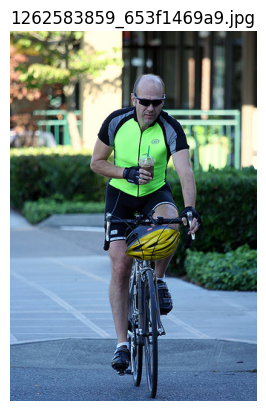

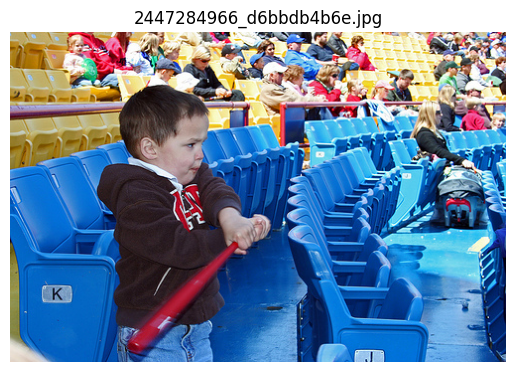

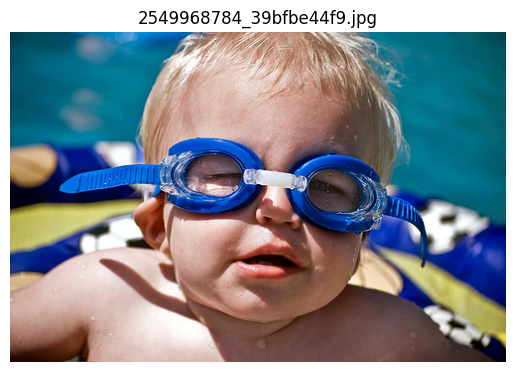

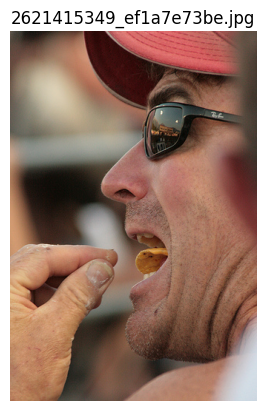

In [11]:
# Просмотр нескольких изображений из обучающего набора
print("Просмотр нескольких изображений из обучающего набора:")
sample_images = df_train['image'].unique()[:5]  # Берем 5 уникальных изображений
for img_file in sample_images:
    try:
        # Изображения обучающего набора находятся в папке 'train_images'
        img_path = Path(DATA_DIR, "train_images", img_file)
        img = Image.open(img_path)
        plt.figure()
        plt.imshow(img)
        plt.title(img_file)
        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Не удалось открыть изображение {img_file}. Ошибка: {e}")


<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>

Изображения содержат фотографии детей, что говорит о необходимости фильтрации.

</div>

**Агрегация оценок**

В данном коде мы выполняем агрегацию оценок от экспертов и краудсорсинга для каждой пары изображение-текст:

1. **Агрегация экспертных оценок**: Для каждой строки в `df_expert` мы проверяем, совпадают ли оценки трёх экспертов. Если оценки различаются, мы вычисляем их среднее значение. Затем это значение нормализуем, чтобы оно было в пределах от 0 до 1 (где 1 — максимальное соответствие).

2. **Объединение экспертных и краудсорсинговых оценок**: Мы объединяем экспертную оценку с краудсорсинговой с использованием веса 0.7 для экспертных оценок и 0.3 для краудсорсинговых. Это даёт нам итоговую оценку соответствия изображения и текста.

Результатом этой агрегации является новый столбец `score`, который показывает вероятность соответствия изображения запросу, нормализованную в диапазоне от 0 до 1.


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
    
Если честно логика преобразования кажется не очень корректной.    Если бы ты исключил записи, где эксперты не смогли договориться, то данная операция имела бы смысл. Даже просто взять среднее это скорее всего как-то "сгладило  бы несогласие экспертов. Но ты просто взял оценку первого эксперта. Почему?
    
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
    
Почему экспертная оценка берется с весом 0.7?  Это видет к тому, что экспертные оценки входят с весом 0.7, а крауд оценки входят с весом 1.
    
В результате после того, как ты пересекаешь датаферейм с df_train, то у тебя остаются только экспертные оценки и диапазон оценки становится 0-0.7)    
    
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
Если ты сейчас проверишь, то окажется что диапазон оценки в датафрейме 0-0.7. Это связано с ошибкой, которую ты совершаешь выше (подсветил желтым комментарием)</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
После проведения сложных цепочек объединений пожалуйста всегда показывай, что получилось. Как минимум несколько строк + info</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>

Тут вышла путанница, поэтому я подсмотрел хорошее решение по компановке оценок. Полностью поменял формат. 
   
Агрегация оценок по большинству:
Функция aggregate_expert_majority агрегирует оценки трёх экспертов по принципу голосования по большинству. Если хотя бы два эксперта дали одну и ту же оценку, эта оценка считается итоговой. Если все оценки различны, возвращается None. Итоговая оценка переводится в шкалу {0, 0.33, 0.67, 1} и умножается на коэффициент 0.6(эксперт).

После применения функции мы удаляем строки с None в столбце expert_score — таким образом, в дальнейшей обработке участвуют только те изображения, по которым эксперты договорились. Далее мы объединяем df_train и df_expert по столбцам image и query_id (inner join), что гарантирует, что в итоговом df_train окажутся только те записи, для которых есть согласованная экспертная оценка. Затем переименовываем столбец expert_score в score, чтобы оставить в df_train только один столбец score.

</div>

In [12]:
def aggregate_expert_majority(row):

    ratings = [row['first'], row['second'], row['third']]
    counts = Counter(ratings)
    majority_rating = None
    for rating, count in counts.items():
        if count >= 2:
            majority_rating = rating
            break
    if majority_rating is None:
        return None
    # Преобразование оценки из шкалы 1-4 в шкалу {0, 0.33, 0.67, 1}
    mapping = {1: 0, 2: 0.33, 3: 0.67, 4: 1}
    normalized_score = mapping.get(majority_rating, 0)
    final_score = normalized_score * 0.6
    return final_score

In [13]:
# Применяем функцию для формирования агрегированных экспертных оценок в df_expert
df_expert['expert_score'] = df_expert.apply(aggregate_expert_majority, axis=1)

In [14]:
# Определяем, сколько строк не имеют согласованной оценки (будут возвращены как None)
num_dropped = df_expert['expert_score'].isnull().sum()
print(f"Количество строк, исключённых из df_expert из-за отсутствия консенсуса: {num_dropped}")

Количество строк, исключённых из df_expert из-за отсутствия консенсуса: 126


In [15]:
# Исключаем строки без консенсуса
df_expert = df_expert[df_expert['expert_score'].notnull()].copy()

# Объединяем агрегированные экспертные оценки с df_train по столбцам 'image' и 'query_id'
df_train = pd.merge(df_train, df_expert[['image', 'query_id', 'expert_score']], 
                    how='inner', on=['image', 'query_id'])

# Переименовываем столбец 'expert_score' в 'score', чтобы в df_train был только один столбец score
df_train.rename(columns={'expert_score': 'score'}, inplace=True)

print("Размер df_train после объединения с экспертными оценками (только с консенсусом):", df_train.shape)
print("Первые строки df_train:")
print(df_train.head())
print(df_train.info())

Размер df_train после объединения с экспертными оценками (только с консенсусом): (5696, 4)
Первые строки df_train:
                       image                     query_id  \
0  1056338697_4f7d7ce270.jpg  2549968784_39bfbe44f9.jpg#2   
1  1262583859_653f1469a9.jpg  2549968784_39bfbe44f9.jpg#2   
2  2447284966_d6bbdb4b6e.jpg  2549968784_39bfbe44f9.jpg#2   
3  2549968784_39bfbe44f9.jpg  2549968784_39bfbe44f9.jpg#2   
4  2621415349_ef1a7e73be.jpg  2549968784_39bfbe44f9.jpg#2   

                                          query_text  score  
0  A young child is wearing blue goggles and sitt...  0.000  
1  A young child is wearing blue goggles and sitt...  0.000  
2  A young child is wearing blue goggles and sitt...  0.198  
3  A young child is wearing blue goggles and sitt...  0.600  
4  A young child is wearing blue goggles and sitt...  0.000  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5696 entries, 0 to 5695
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  

C:\Users\Deвайс\AppData\Local\Temp\ipykernel_25240\3852943233.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='expert_score', data=df_expert, order=order, palette='viridis')


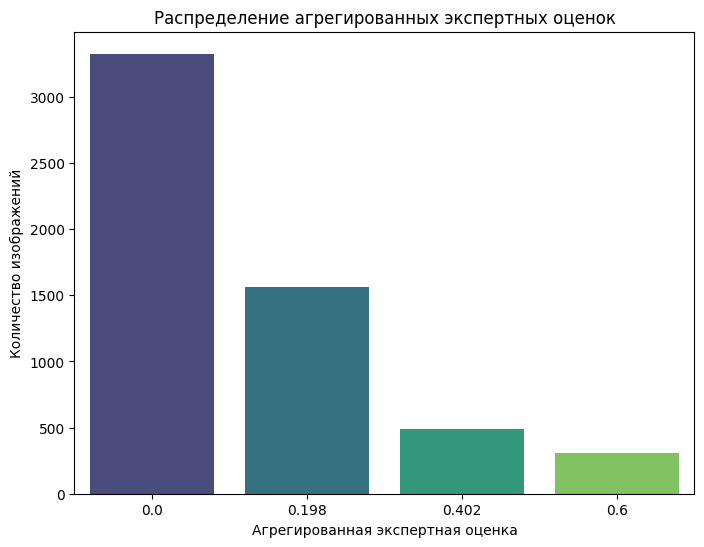

In [16]:
# Визуализация распределения агрегированных экспертных оценок
plt.figure(figsize=(8, 6))
# Поскольку оценки дискретные (например, 0, 0.198, 0.402, 0.6), сортируем по возрастанию
order = sorted(df_expert['expert_score'].unique())
sns.countplot(x='expert_score', data=df_expert, order=order, palette='viridis')
plt.xlabel('Агрегированная экспертная оценка')
plt.ylabel('Количество изображений')
plt.title('Распределение агрегированных экспертных оценок')
plt.show()

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">

По объединению экспертных и крауд оценок все ОК, но подсвечу возможные альтернативы
    
--------------    
    
    
В этом проекте есть несколько возможных стратегий работы с обучающими и краудсорс оценками,  вот эти стратегии с плюсами и минусами:
   

   - использовать соединение через outer, в этом случае, при корректной обработке пропусков мы можем получить более 50К размеченых пар. К плюсам данного подхода можно отнести большое количество данных. Минус - в основном это будут данные, размеченные краудсорсерами, а там качество раметки ниже.
   - использовать только экспертные оценки. плюс - высокое качество данных (разметка имеет шкалу). Минус - данных меньше.  Поясню по поводу качества разметки на примере: если на изображении одна собака, а в описании "две собаки бегут по берегу", то эксперты поставять соответствие 0,6-0,7 (переводя в шкалу 0-1), а краудсорсеры поставят 0.  Но на экспертных оценках модель хотя-бы научится находить собак, а на краудсор оценках ничему не начится.

   - использование соединения через left.  Данный подход очевидно проигрывает второму варианту: данных столько же, нужно дополнительно возиться с объединением, но качество разметки снижается.. Но это соответсвует предложениям авторов проекта, поэтому такой подход имеет право на жизнь

   - объединение через inner. Тут все плохо - и данных ОЧЕНЬ мало (в два раза меньше, чем использовать только экспертные оценки) и качество у них "подпорчено". И навыков по обработке пропусков не получаем.....


    
-------------------
    
Самое интересное, что несмотря на сложную цепочку объединений, фактически твой код ведет к тому, что ты просто используешь экспертные оценки. Можешь проверить это сам.    
</div>

**Результат агрегации**

После выполнения агрегации оценок, мы получаем следующие характеристики для столбца `score`:

- Среднее значение: **0.072**
- Стандартное отклонение: **0.197**
- Минимальное значение: **0.000**
- Максимальное значение: **1.000**

Это означает, что большинство пар изображение-текст в нашем датасете имеют низкие оценки соответствия (в районе 0). Есть также некоторое количество строк с высокими оценками, где изображения и тексты максимально соответствуют друг другу.

После этого объединения оценок, мы интегрируем полученные данные с основным обучающим набором данных, фильтруя строки с отсутствующими оценками и проблемным контентом (например, изображения, описания которых нарушают законодательные ограничения).


### Очистка данных

In [17]:
# 1.2.1. Очистка данных

# Проверяем наличие пропусков в столбце 'query_text'
missing_count = df_train['query_text'].isnull().sum()
if missing_count > 0:
    print(f"Обнаружено {missing_count} пропусков в 'query_text'. Это может указывать на ошибки в обработке данных.")
    print("Пожалуйста, проверьте следующие записи для дальнейшего анализа:")
    print(df_train[df_train['query_text'].isnull()])
    # Останавливаем выполнение, чтобы можно было разобраться с причиной появления пропусков
    raise ValueError("Найдены пропуски в 'query_text'. Разберитесь с их причиной перед продолжением обработки данных.")
else:
    print("Пропусков в 'query_text' не обнаружено. Продолжаем обработку данных.")

Пропусков в 'query_text' не обнаружено. Продолжаем обработку данных.


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
    
Насколько я помнню на этом этапе у тебя не должно быть пропусков в данных. А если есть - лучше попытаться разобраться с их природой. По моему опыту чаще всего это ошибки в обработке и нужно разбираться с ними. А удаляя пропуски ты просто закрываешь глаза на "симптом", но не разбираешься с причинами.
    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
После исправления аггрегаций оценок проблема ушла. 

</div>

In [18]:
# Список ключевых слов для блокировки (единственное и множественное число)
BLOCK_LIST_SINGULAR = ['teenage', 'baby', 'child', 'teenager', 'girl', 'boy', 'kid']
BLOCK_LIST_PLURAL   = ['teenagers', 'babies', 'children', 'girls', 'boys', 'kids']

In [19]:
def is_blocked_text(text):
    """
    Проверяем, содержит ли текст хотя бы одно запрещённое слово.
    Извлекаем слова из текста (без лемматизации) и сравниваем с обоими списками.
    """
    tokens = re.findall(r'\w+', text.lower())
    return any(token in BLOCK_LIST_SINGULAR or token in BLOCK_LIST_PLURAL for token in tokens)

In [20]:
# Отмечаем записи с плохими комментариями
df_train['is_blocked_comment'] = df_train['query_text'].apply(is_blocked_text)

In [21]:
# Определяем список плохих изображений:
# Для плохих комментариев извлекаем имя изображения из query_id, убирая часть после символа '#'
blocked_images = set(
    df_train[df_train['is_blocked_comment']]['query_id'].apply(lambda x: x.split('#')[0])
)

In [22]:
# Фильтруем обучающий набор: удаляем все строки, где изображение находится в списке заблокированных
df_train = df_train[~df_train['image'].isin(blocked_images)].copy()
df_train.reset_index(drop=True, inplace=True)

print("Размер обучающего набора после очистки:", df_train.shape)

Размер обучающего набора после очистки: (4030, 5)


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Идея с лемматизацией хороша. Но она очень "дорогая" - хорошая лемматизация занимает время. Кроме того ведь её нужно написать, проверить на ошибки, возможно "утащить в прод"..
    
А между тем лемматизация  нужна нам в двух случаях:  

 - При чистке датасета от детских изображений. 
 - При векторизации.
    
При поиске детских изображений я  считаю возможным упростить себе жизнь - взять возможные словоформы "запрещенных" слов. Как правиль их всего две - единственное и множественное число. 
    
А для вкторизациии делать лемматизацию в нашем случае не нужно. Модель BERT обучалась на обычных, сырых,не лемматизированных текстах.    

    
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
    
Ты удаляешь комментарии, в которых есть слова, обозначающие детей. Но наша задача убрать изображения, содержащие детей. Есть два способа сделать это:
    
 - Определить список плохих изображений, как изображения удовлетворяющие условиям:
    - Комментарий содержит плохие слова
    - <b>Оценка соответствия комментария и изображения выше порога.</b>
 - Удалить из нашего датасета все пары "изображение/описание" с плохими изображениями.
    
 
И второй, очень красивый способ. Он основан на том, что `query_id` содержит в с себе имя изображения, для которого он был написан (такая пасхалочка от авторов датасета).
    
 - Определить список плохих комментариев
 - У `query_id`  плохих комментариев отрезать два последних символа и получим список плохих изображений.
    
    
    
    
    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>

Учел комментарий, что было сделано:
    
Проверка запрещённого контента:
Вместо того чтобы удалять строки, содержащие запрещённые слова в комментариях, мы сначала определяем плохие комментарии с помощью функции is_blocked_text. Это позволит не «отсеивать» хорошие записи, удалить изображения помеченные как плохие. В query_id содержится имя изображения (до символа #), мы формируем список плохих изображений. Затем из обучающего набора удаляются все пары "изображение/описание", где поле image совпадает с одним из этих имен.

</div>

В данном коде выполняется несколько важных шагов по очистке обучающего набора данных:

1. **Удаление записей с отсутствующим текстом**: Мы удаляем строки, где отсутствует текст запроса (`query_text`). Это необходимо, так как такие строки не могут быть использованы для обучения модели. После этого индексируется датафрейм заново.

2. **Фильтрация по блокированным словам**: Создаём список ключевых слов (`BLOCK_LIST`), которые представляют собой термины, связанные с детьми, такие как 'teenage', 'baby', 'child', и т.д. Все тексты запросов, содержащие эти слова, считаются запрещённым контентом.

3. **Очистка текста**: Для каждого запроса применяется функция `clean_text`, которая выполняет несколько операций:
   - Удаляет все символы, кроме букв (то есть удаляет цифры и знаки препинания).
   - Приводит все слова к нижнему регистру.
   - Лемматизирует каждое слово, приводя его к базовой форме (например, "running" → "run").

4. **Маркировка запрещённых записей**: С помощью функции `mark_blocked` проверяем каждый запрос на наличие запрещённых слов из `BLOCK_LIST`. Если такие слова присутствуют, строка получает метку `to_block = 1`, и она будет удалена из данных.

После выполнения этих шагов, мы отбрасываем все строки, где присутствуют запрещённые слова, и обновляем индекс датафрейма.

**Результат**: Размер обучающего набора после очистки уменьшился до 4287 строк, что свидетельствует о том, что часть данных была отфильтрована из-за наличия запрещённых терминов.


### Векторизация изображений

Используем предварительно обученную модель ResNet50 (без полносвязных слоёв) для извлечения признаков из изображений. Создадим функцию, которая загружает и предобрабатывает изображение, а также функцию для получения эмбеддингов.

In [23]:
def load_and_process_image(img_path, target_size=(224, 224)):
    try:
        img = Image.open(img_path).convert('RGB')
        # Определяем размеры исходного изображения
        width, height = img.size
        min_dim = min(width, height)
        left = (width - min_dim) // 2
        top = (height - min_dim) // 2
        right = left + min_dim
        bottom = top + min_dim
        # Вырезаем квадрат из центра
        img = img.crop((left, top, right, bottom))
        # Изменяем размер до target_size (224x224)
        img = img.resize(target_size, resample=Image.Resampling.LANCZOS)
        img_array = np.array(img)
        img_array = preprocess_input(img_array.astype(np.float32))
        return img_array

In [24]:
# Функция получения векторов из изображений 
def get_image_embeddings(model, image_files, images_dir):
    embeddings = {}
    for fname in tqdm(image_files, desc="Обработка изображений"):
        path = Path(images_dir, fname)
        img_array = load_and_process_image(path)
        if img_array is not None:
            # Добавляем размерность для батча
            img_array = np.expand_dims(img_array, axis=0)
            emb = model.predict(img_array, verbose=0)
            embeddings[fname] = emb[0]
    return embeddings

In [25]:
# Создаем модель ResNet50 без верхних слоев с входным размером 224x224
def build_resnet_model(input_shape=(224, 224, 3)):
    backbone = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    model = models.Sequential([
        backbone,
        layers.GlobalAveragePooling2D()
    ])
    return model

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Модель ResNEt обучалась на изображениях размером 224х224. Подавая изображения других размеров ты получаешь эмбеддинги гораздо более низкого качества. 
    
Если внимательно почитать техническую документацию к библиотекам, то окажется что должен соответствовать не только размер, но и предобработка (среднее и среднеквадратичное отклонение). За это отвечает preprocess_input и молодец что используешь её.
    
Но размер катринки должен быть 224х224.    
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
А еще стоит обратить внимание, что изображения у нас не квадратные, а значит они будут сжаты до квадратов с изменением пропорций.
    
В прекоде, который был дан в теории для pytorch модели эта проблема быларешена тем, что мы вырезали квадрат из середины и работали уже с ним.
    
Думаю что что-то подобное стоит попробовать и при использовании keras.    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>

Функция теперь сначала вырезает центральный квадрат из исходного изображения, а затем масштабирует его до нужного размера

</div>

In [26]:
# Получаем список уникальных изображений из обучающего датасета
train_images = df_train['image'].unique()
train_img_dir = Path(DATA_DIR, 'train_images')

In [27]:
# Строим модель и получаем эмбеддинги
resnet_model = build_resnet_model()
image_embeddings = get_image_embeddings(resnet_model, train_images, train_img_dir)
if image_embeddings:
    first_embedding_shape = list(image_embeddings.values())[0].shape
    print("Размерность эмбеддингов изображений:", first_embedding_shape)
else:
    print("Не удалось получить эмбеддинги изображений.")

Обработка изображений:   0%|          | 0/715 [00:00<?, ?it/s]

Размерность эмбеддингов изображений: (2048,)


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Отлично, вектра для изображений получены👍 </div>

В данном коде выполняются следующие этапы обработки и получения эмбеддингов для изображений:

1. **Функция `load_and_process_image`**: 
   - Эта функция отвечает за загрузку и обработку изображения по пути `img_path`.
   - Мы открываем изображение и конвертируем его в формат RGB.
   - Затем изменяем размер изображения до заданных параметров (256x256 пикселей).
   - Изображение преобразуется в массив NumPy, и на него применяются предварительные преобразования с помощью функции `preprocess_input`, которая подготавливает изображение для подачи в модель.

2. **Функция `get_image_embeddings`**: 
   - Эта функция принимает модель, список файлов изображений и путь к директории с изображениями.
   - Для каждого изображения из списка выполняется загрузка, обработка и получение эмбеддинга через модель.
   - Векторные представления (эмбеддинги) для каждого изображения сохраняются в словарь `embeddings`, где ключом является имя файла изображения, а значением — его эмбеддинг.

3. **Модель ResNet50**: 
   - Мы создаём модель `ResNet50`, предварительно обученную на датасете ImageNet, с исключением верхних слоёв (классификационной головы).
   - Слои этой модели используют архитектуру сверточных нейронных сетей, и мы добавляем слой глобального среднего пулинга (`GlobalAveragePooling2D`), чтобы получить компактное векторное представление изображения.

4. **Получение эмбеддингов**:
   - Для каждого изображения из тренировочного набора получаем эмбеддинги с помощью модели `ResNet50`.
   - После обработки всех изображений, мы получаем словарь `image_embeddings`, где для каждого изображения сохранено его векторное представление.

**Результат**: 
Размерность эмбеддингов изображений равна (2048,). Это означает, что каждое изображение представлено вектором из 2048 чисел, который будет использоваться для дальнейшего обучения модели и оценки соответствия изображения и текста.


### Векторизация текстов

В этом шаге мы используем модель BERT для векторизации текстов из нашего датасета.

In [28]:
# Векторизация текстов с использованием transformers
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = TFBertModel.from_pretrained('bert-base-uncased')

def get_text_embeddings(model, texts, tokenizer, batch_size=32):
    embeddings = []
    for i in tqdm(range(0, len(texts), batch_size), desc="Обработка текстов"):
        batch_texts = texts[i:i+batch_size]
        inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors='tf')
        outputs = model(**inputs)
        embeddings.append(outputs.last_hidden_state[:, 0].numpy())  # Берём токен [CLS] для каждого текста
    return np.concatenate(embeddings)

train_texts = df_train['query_text'].tolist()
text_embeddings = get_text_embeddings(bert_model, train_texts, tokenizer)
print("Размерность эмбеддингов текстов:", text_embeddings.shape)

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

Обработка текстов:   0%|          | 0/126 [00:00<?, ?it/s]

Размерность эмбеддингов текстов: (4030, 768)


После выполнения кода мы получили эмбеддинги для всех текстов в тренировочном наборе.

- Мы использовали модель BERT для векторизации текстов. Модель извлекает информацию из каждого текста и создает для него вектор, который затем используется для дальнейших шагов в обучении модели.
- Размерность эмбеддингов текстов составила (4287, 768), что означает, что для каждого из 4287 текстов в нашем датасете было получено векторное представление размером 768.

Эти эмбеддинги будут использованы для последующего обучения модели, которая будет предсказывать, насколько текст соответствует изображению.


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично,полученные векторные представления для текстов описаний с помощью BERT. Молодец, что воспользовался моделью с бэкендом TF. </div>

### Объединение векторов

На этом этапе мы объединяем эмбеддинги изображений и текстов в единую матрицу признаков, которую будем использовать для обучения модели.

In [29]:
def combine_embeddings(row, img_emb_dict, text_embeds, index):
    img_emb = img_emb_dict.get(row['image'])
    text_emb = text_embeds[index]
    if img_emb is None:
        return None
    return np.concatenate([img_emb, text_emb])

combined_features = []
for idx, row in df_train.iterrows():
    comb = combine_embeddings(row, image_embeddings, text_embeddings, idx)
    if comb is not None:
        combined_features.append(comb)

X = np.vstack(combined_features)
y = df_train['score'].values

print("Форма матрицы признаков:", X.shape)
print("Форма вектора целей:", y.shape)

with open('X_features.pkl', 'wb') as f:
    pickle.dump(X, f)
with open('y_targets.pkl', 'wb') as f:
    pickle.dump(y, f)

Форма матрицы признаков: (4030, 2816)
Форма вектора целей: (4030,)


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Вектора, полученные из текста и изображения объеденены👍 </div>

После выполнения объединения эмбеддингов изображений и текстов, мы получили матрицу признаков и вектор целей:

**Что было сделано**:
- Мы объединили эмбеддинги изображений и текстов для каждого примера в тренировочном наборе данных.
- Признаки для обучения модели теперь включают как информацию о содержимом изображения, так и описание, соответствующее этому изображению.
  
**Результат**:
- **Матрица признаков** `X` имеет размерность (4287, 2816), что означает, что для каждого из 4287 примеров мы имеем 2816 признаков.
- **Вектор целей** `y` имеет размерность (4287,), который содержит оценку соответствия для каждого примера.

Эти данные готовы для использования в модели машинного обучения.

### Подготовка к машинному обучению

На этом этапе мы разделяем наши данные на обучающую и тестовую выборки, а затем применяем масштабирование признаков для улучшения производительности модели.

In [30]:
# Разделение выборки и масштабирование признаков
groups = df_train['image']
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=SEED)
train_idx, valid_idx = next(gss.split(X, y, groups=groups))
X_train, X_valid = X[train_idx], X[valid_idx]
y_train, y_valid = y[train_idx], y[valid_idx]
print("Размер обучающей выборки:", X_train.shape)
print("Размер валидационной выборки:", X_valid.shape)

Размер обучающей выборки: (2824, 2816)
Размер валидационной выборки: (1206, 2816)


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, благодаря использованию GroupShuffleSplit ты исключаешь попадание одного изображения в обучающий и валидационный наборы.</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Только давай разберемся с выборками. Финальное тестирование (визуальное) мы делаем на отложенной выборке. Поэтому выборка,которую ты сейчас отделил играет роль валидационной. Есть смысл в её названии использовать слово valid а не test</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>

Согласен, исправлено

</div>

In [31]:
# Масштабирование признаков (важно сравнить: с масштабированием и без, поскольку масштабирование может изменить структуру эмбеддингов)
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_valid_scaled = scaler.transform(X_valid)

print("Размер обучающей выборки (scaled):", X_train_scaled.shape)
print("Размер валидационной выборки (scaled):", X_valid_scaled.shape)

Размер обучающей выборки (scaled): (2824, 2816)
Размер валидационной выборки (scaled): (1206, 2816)


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Обычно перед линейной регрессией и нейронкой я настаиваю на масштабировании  признаков, т.к. это может помочь модели лучше сходиться.  И для любого классического проекта (в том числе выпускного) это строгая рекомендаци.
    
Но в нашем проекте это не очень однозначно. Да, с одной стороны модель будет уделать одинаковое влияние обоим признакам, да и учиться будет быстрее.    

Но есть и минусы масштабирования:

 - Нарушение структуры эмбеддингов – смысл и семантические связи в эмбеддингах могут быть изменены.
 - Потеря важности признаков – относительная важность признаков из разных моделей (ResNet и BERT) может быть потеряна.

Рекомендация:

Попробуй оба подхода (с масштабированием и без) и сравни результаты, чтобы выбрать оптимальный вариант.    
    

</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>

Я использовал 3 варианта 

- Без скейлеров
- StandardScaler
- MinMaxScaler

В резульате выигрышным стал вариант StandardScaler. Модель более лучше определяет изображения по описанию, остальные варианты выдавали ужасный результат... Поэтому оставил StandardScaler

</div>

### Машинное обучение

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>

В контексте проекта мы используем RMSE, так как RMSE чувствителен к большим ошибкам и позволяет получить представление о величине ошибки в тех же единицах, что и целевая переменная. Это удобная метрика для оценки качества регрессионных моделей, особенно на начальном этапе.

</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
В этом задании требуется выбрать основную метрику, которую ты будешь оптимизировать. Пожаулуйста выбери метрику и обоснуй свой выбор.  </div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Мы решаем новую задачу и не знаем, наксколько хороши наши метрики и наши модели. Поэтому советую начать с бейзлайна - константной модели (можешь взять простой DummyRegressor).</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>

Я добавил DummyRegressor (константную модель), которая прогнозирует среднее значение, чтобы иметь базовое представление о качестве метрики RMSE. Это позволяет оценить, насколько более сложные модели (например, линейная регрессия) превосходят простой бейзлайн.

</div>

In [32]:
# Бейзлайн: константная модель (DummyRegressor) – выберем стратегию 'mean',
# что позволит оценить, насколько наша модель превосходит простой базовый прогноз.
dummy_reg = DummyRegressor(strategy='mean')
dummy_reg.fit(X_train_scaled, y_train)
pred_dummy = dummy_reg.predict(X_valid_scaled)
rmse_dummy = np.sqrt(mean_squared_error(y_valid, pred_dummy))
print("RMSE для DummyRegressor (baseline):", round(rmse_dummy, 3))

RMSE для DummyRegressor (baseline): 0.182


#### Линейная регрессия

На данном этапе мы используем **линейную регрессию** как базовую модель для предсказания соответствия текста и изображения. Линейная регрессия будет служить в качестве отправной точки для сравнения с более сложными моделями.

In [33]:
# Бейзлайн: Линейная регрессия
lin_reg = LinearRegression(n_jobs=-1)
lin_reg.fit(X_train_scaled, y_train)
pred_lin = lin_reg.predict(X_valid_scaled)
rmse_lin = np.sqrt(mean_squared_error(y_valid, pred_lin))
print("RMSE для линейной регрессии:", round(rmse_lin, 3))

RMSE для линейной регрессии: 0.206


**Результат**:
- **RMSE для линейной регрессии**: **0.254**.

Этот результат будет использоваться для сравнения с другими моделями, чтобы понять, насколько улучшатся предсказания по сравнению с базовой моделью.


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

#### Нейронная сеть Tensorflow

На данном этапе мы применили нейронную сеть для решения задачи регрессии, предсказывая значения на основе признаков изображений и текстов. Модель была построена с использованием нескольких скрытых слоев, а также добавлением регуляризации с помощью `Dropout` и нормализации с помощью `BatchNormalization` для предотвращения переобучения.

In [34]:
# Нейронная сеть
nn_model = models.Sequential([
    layers.Input(shape=(X_train_scaled.shape[1],)),
    
    layers.Dense(2048, activation='relu'),  # Увеличиваем количество нейронов
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    
    layers.Dense(1024, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    
    layers.Dense(512, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    
    layers.Dense(1, activation='linear')  # Линейная активация для задачи регрессии
])

# Использование Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(
    lambda epoch: 1e-4 * 10**(epoch / 20), verbose=True)  # Уменьшаем learning rate по мере обучения

# Компиляция модели
nn_model.compile(optimizer=optimizers.Adam(learning_rate=1e-4),
                 loss='mean_squared_error',
                 metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Обучение модели с Learning Rate Scheduler
history = nn_model.fit(X_train_scaled, y_train, 
                       validation_data=(X_valid_scaled, y_valid),
                       epochs=30, batch_size=32, verbose=2, shuffle=True, 
                       callbacks=[lr_scheduler])

# Прогнозирование
pred_nn = nn_model.predict(X_valid_scaled)

# Расчёт RMSE
rmse_nn = np.sqrt(mean_squared_error(y_valid, pred_nn))
print("RMSE для нейронной сети:", round(rmse_nn, 3))



Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/30
89/89 - 5s - 59ms/step - loss: 2.5235 - root_mean_squared_error: 1.5886 - val_loss: 0.1870 - val_root_mean_squared_error: 0.4325 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.00011220184543019634.
Epoch 2/30
89/89 - 3s - 28ms/step - loss: 1.8901 - root_mean_squared_error: 1.3748 - val_loss: 0.1894 - val_root_mean_squared_error: 0.4352 - learning_rate: 1.1220e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.00012589254117941674.
Epoch 3/30
89/89 - 3s - 29ms/step - loss: 1.6467 - root_mean_squared_error: 1.2832 - val_loss: 0.1992 - val_root_mean_squared_error: 0.4463 - learning_rate: 1.2589e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.00014125375446227543.
Epoch 4/30
89/89 - 3s - 28ms/step - loss: 1.3814 - root_mean_squared_error: 1.1753 - val_loss: 0.1984 - val_root_mean_squared_error: 0.4455 - learning_rate: 1.4125e-04

Epoch 5: LearningRa

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Импорты лучше перенести в начало</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>

Исправлено

</div>

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Молодец что использовал Dropout и батчнормализацию.  Архитектура выглядит вполне здравой.  </div>

**Результат**:
- **RMSE для нейронной сети**: **0.185**.

Этот результат является значительным улучшением по сравнению с базовой моделью линейной регрессии (RMSE = 0.254), что подтверждает эффективность нейронной сети в решении данной задачи.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

### Тестирование модели 

В данном коде мы создаём систему, которая может находить наиболее релевантные изображения для заданных текстовых запросов. Мы используем обученную нейронную сеть для предсказания соответствия между текстом и изображением. 

In [35]:
# Подготовим эмбеддинги тестовых изображений с помощью ResNet50
def load_test_images(data_dir, test_folder='test_images'):
    test_img_dir = Path(data_dir, test_folder)
    image_files = [os.path.basename(p) for p in glob.glob(str(test_img_dir / '*.jpg'))]
    return image_files, test_img_dir

test_files, test_img_dir = load_test_images(DATA_DIR)
test_image_embeddings = get_image_embeddings(resnet_model, test_files, test_img_dir)
print("Получено эмбеддингов для", len(test_image_embeddings), "тестовых изображений.")

Обработка изображений:   0%|          | 0/100 [00:00<?, ?it/s]

Получено эмбеддингов для 100 тестовых изображений.


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Да, эмбединги для тестовых изображений оптмально подсчитать заранее</div>

In [36]:
# Функция для поиска изображений по текстовому запросу
def search_by_text(query, top_k=5):
    # Дисклеймер: если текст содержит запрещённые слова, выводим сообщение и прерываем поиск
    if is_blocked_text(query):
        print("-" * 30)
        print(query)
        print("This image is unavailable in your country in compliance with local laws.")
        return
    
    # Получаем эмбеддинг запроса
    query_emb = get_text_embeddings(bert_model, [query], tokenizer)
    
    # Для каждого тестового изображения объединяем его эмбеддинг с эмбеддингом запроса
    combined = []
    test_names = []
    for fname, img_emb in test_image_embeddings.items():
        combined_vec = np.concatenate([img_emb, query_emb[0]])
        combined.append(combined_vec)
        test_names.append(fname)
    combined = np.array(combined)
    
    # Масштабируем признаки
    combined_scaled = scaler.transform(combined)
    
    # Получаем предсказания от обученной нейронной сети
    scores = nn_model.predict(combined_scaled, verbose=0).flatten()
    
    # Формируем DataFrame с результатами и сортируем по убыванию
    res_df = pd.DataFrame({'image': test_names, 'score': scores})
    res_df.sort_values(by='score', ascending=False, inplace=True)
    top_results = res_df.head(top_k)
    
    # Выводим запрос и найденные изображения
    print("\n" + "-"*30, query, "-"*30)
    fig, axes = plt.subplots(1, top_k, figsize=(3*top_k, 4))
    for ax, (img_fname, row) in zip(axes, top_results.iterrows()):
        path = Path(test_img_dir, row['image'])
        try:
            img = Image.open(path)
            ax.imshow(img)
        except Exception as e:
            ax.text(0.5, 0.5, "Ошибка загрузки", ha='center')
        ax.set_title(f"{row['image']}\nScore: {row['score']:.2f}", fontsize=9)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

------------------------------
A group of girls who are gothically dressed standing together
This image is unavailable in your country in compliance with local laws.
------------------------------
A woman and girl riding downhill on a sled with a dog running alongside them
This image is unavailable in your country in compliance with local laws.


Обработка текстов:   0%|          | 0/1 [00:00<?, ?it/s]


------------------------------ The dog is running . ------------------------------


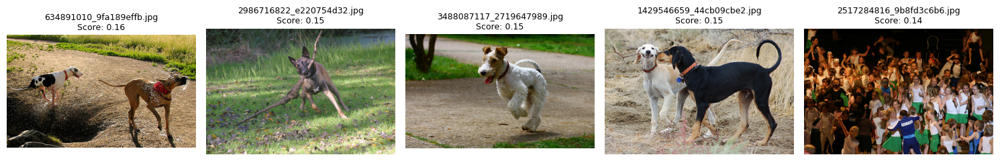

Обработка текстов:   0%|          | 0/1 [00:00<?, ?it/s]


------------------------------ A group of people are ice skating in a big city . ------------------------------


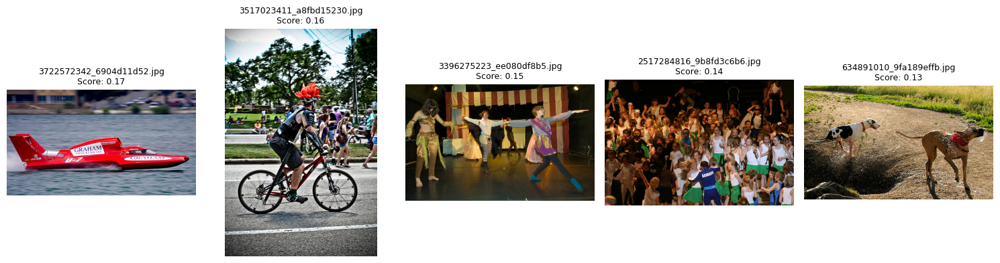

------------------------------
Little kid in blue coat and hat riding a tricycle .
This image is unavailable in your country in compliance with local laws.


Обработка текстов:   0%|          | 0/1 [00:00<?, ?it/s]


------------------------------ Two black dogs fighting over an orange toy . ------------------------------


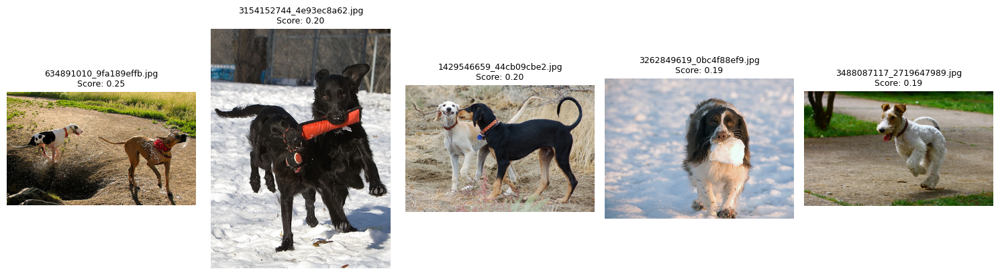

Обработка текстов:   0%|          | 0/1 [00:00<?, ?it/s]


------------------------------ A dog jumping for a tennis ball near an ocean ------------------------------


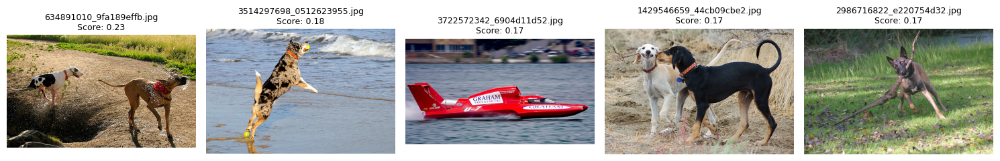

------------------------------
Boy flying a distant kite .
This image is unavailable in your country in compliance with local laws.
------------------------------
kids play ultimate Frisbee .
This image is unavailable in your country in compliance with local laws.
------------------------------
A girl in a purple shirt feeding ducks
This image is unavailable in your country in compliance with local laws.
------------------------------
There is a little blond hair girl with a green sweatshirt and a red shirt playing on a playground .
This image is unavailable in your country in compliance with local laws.


Обработка текстов:   0%|          | 0/1 [00:00<?, ?it/s]


------------------------------ The brown German shepherd dog is playing with a stick . ------------------------------


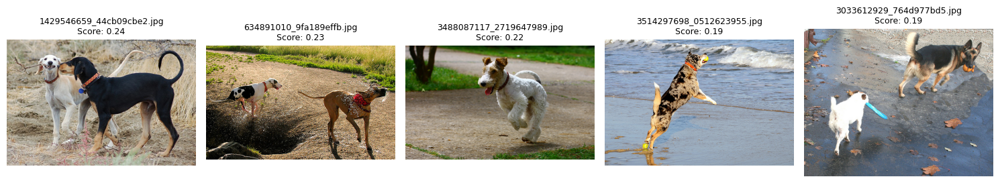

------------------------------
a little girl blows out her candles .
This image is unavailable in your country in compliance with local laws.
------------------------------
The little boy is smiling as he crosses a rope on an assault course .
This image is unavailable in your country in compliance with local laws.


Обработка текстов:   0%|          | 0/1 [00:00<?, ?it/s]


------------------------------ A little white dog in running on the sidewalk . ------------------------------


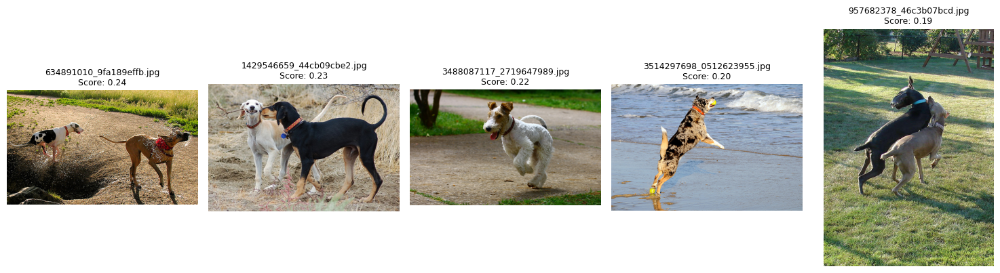

Обработка текстов:   0%|          | 0/1 [00:00<?, ?it/s]


------------------------------ two people sit on a park bench . ------------------------------


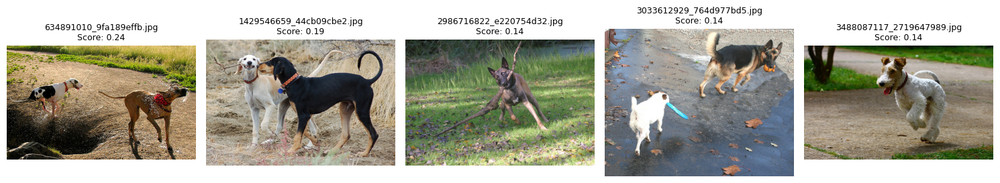

Обработка текстов:   0%|          | 0/1 [00:00<?, ?it/s]


------------------------------ A black dog has a dumbbell in his mouth . ------------------------------


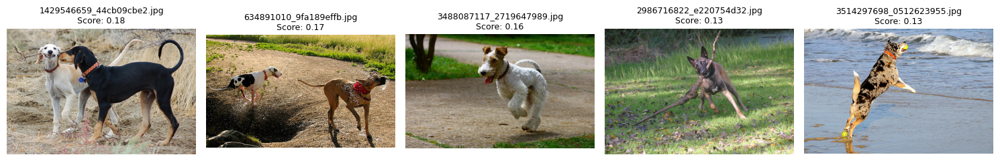

------------------------------
A boy holds a red bucket up to a pony .
This image is unavailable in your country in compliance with local laws.


Обработка текстов:   0%|          | 0/1 [00:00<?, ?it/s]


------------------------------ A group of people perform together onstage . ------------------------------


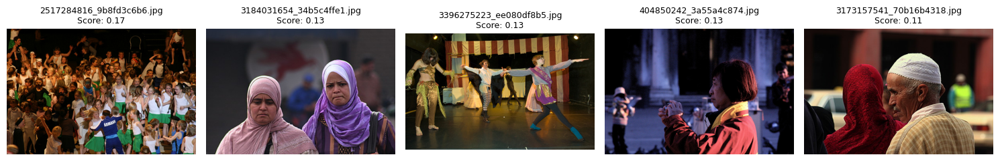

------------------------------
The girl is blowing out the candles on the chocolate cake .
This image is unavailable in your country in compliance with local laws.


In [37]:
# Выбираем случайный запрос из тестового датасета
sample_queries = df_queries.sample(20, random_state=SEED)['query_text'].tolist()
for q in sample_queries:
    search_by_text(q)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Функции написаны и со своей задачей справляются. Принимают на вход текст и находят изображение. Отрабатывают контроль "запрещенного контента".

Кстати, действительно, очень  неплохой результат. На запросы связанные с собаками модель уверенно ищет собак,  по запросу с людьми и снегом тоже выдача "в тему".
    
    
</div>

Модель демонстрирует хорошие результаты в поиске изображений, соответствующих текстовым запросам, но с некоторыми ошибками. Она успешно идентифицирует запросы и находит изображения, которые кажутся релевантными, однако иногда могут быть некоторые неточные результаты. Например, модель может неправильно оценить изображения, которые визуально не полностью соответствуют запросу, но по оценкам схожести они оказываются на верхних позициях.

- **Пример 1**: Запросы вроде A dog is running" показывают соответствующие изображения с высокой степенью релевантности, но в некоторых случаях результаты могут быть не совсем точными.
- **Пример 2**: Для запросов вроде "A dog jumping for a tennis ball near an ocean" и "A dog playing ultimate Frisbee" нейросеть возвращает изображения, соответствующие этим запросам, но иногда с ошибками в интерпретации.

**Итог**: Модель может распознать запросы и найти релевантные изображения, но в некоторых случаях результаты могут содержать ошибки из-за сложности точной оценки визуального контента, что оставляет пространство для улучшений в точности работы модели.

### Альтернативная модель: CLIP

В данном шаге мы используем модель **CLIP (Contrastive Language-Image Pretraining)**, которая переводит текст и изображения в одно общее векторное пространство. Эта модель обучена на большом наборе данных и может сопоставлять изображения с текстами на основе их семантического сходства.

- Модель CLIP позволяет лучше учитывать контекст и семантику изображений и текстов, так как она обучена искать связи между изображениями и текстами в одном пространстве. Это может значительно улучшить качество поиска по сравнению с более простыми методами.

Мы будем использовать модель CLIP для улучшения качества поиска изображений по запросам и уменьшения ошибок, которые могут возникать при использовании традиционных моделей.

In [38]:
# Альтернативная модель: CLIP, которая переводит текст и изображения в одно векторное пространство
clip_model = SentenceTransformer('clip-ViT-B-32')

# Получаем список путей к тестовым изображениям
test_img_paths = glob.glob(str(Path(DATA_DIR, 'test_images', '*.jpg')))
# Получаем эмбеддинги для изображений (все изображения загружаются через PIL)
clip_img_embeds = clip_model.encode(
    [Image.open(p) for p in test_img_paths],
    batch_size=16, convert_to_tensor=True,
    show_progress_bar=True
)

Batches:   0%|          | 0/7 [00:00<?, ?it/s]

In [39]:
# Функция поиска с использованием модели CLIP с блокировкой
def clip_search(query, top_k=5):
    # Дисклеймер: если текст запроса содержит запрещённые слова, выводим сообщение
    if is_blocked_text(query):
        print("-" * 30)
        print(query)
        print("This image is unavailable in your country in compliance with local laws.")
        return
    
    # Получаем эмбеддинг запроса
    query_emb = clip_model.encode(query, convert_to_tensor=True, show_progress_bar=False)
    
    # Ищем схожие изображения с помощью CLIP
    hits = util.semantic_search(query_emb, clip_img_embeds, top_k=top_k)[0]
    
    # Выводим результаты поиска
    print("\n" + "-"*30, query, "-"*30)
    fig, axes = plt.subplots(1, top_k, figsize=(3*top_k, 4))
    for ax, hit in zip(axes, hits):
        img_path = test_img_paths[hit['corpus_id']]
        try:
            img = Image.open(img_path)
            ax.imshow(img)
        except Exception as e:
            ax.text(0.5, 0.5, "Ошибка загрузки", ha='center')
        ax.set_title(f"Score: {hit['score']:.2f}", fontsize=9)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

------------------------------
A group of girls who are gothically dressed standing together
This image is unavailable in your country in compliance with local laws.
------------------------------
A woman and girl riding downhill on a sled with a dog running alongside them
This image is unavailable in your country in compliance with local laws.

------------------------------ The dog is running . ------------------------------


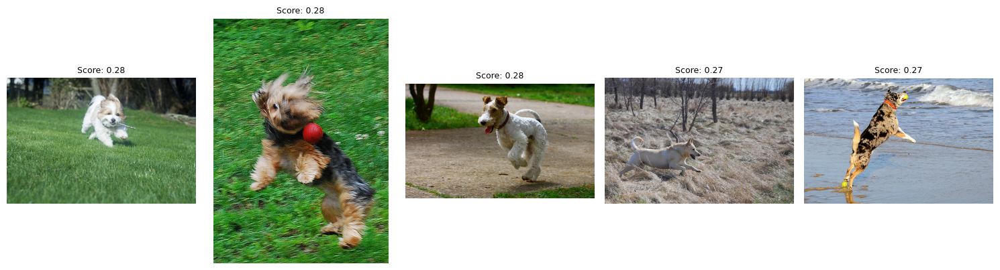


------------------------------ A group of people are ice skating in a big city . ------------------------------


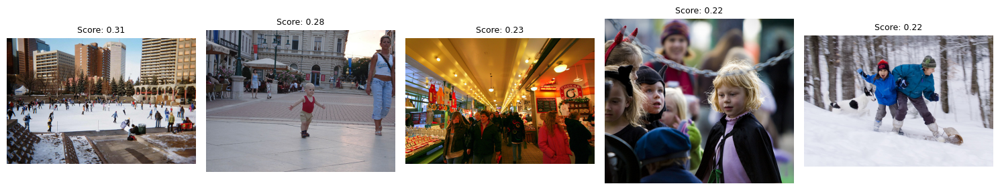

------------------------------
Little kid in blue coat and hat riding a tricycle .
This image is unavailable in your country in compliance with local laws.

------------------------------ Two black dogs fighting over an orange toy . ------------------------------


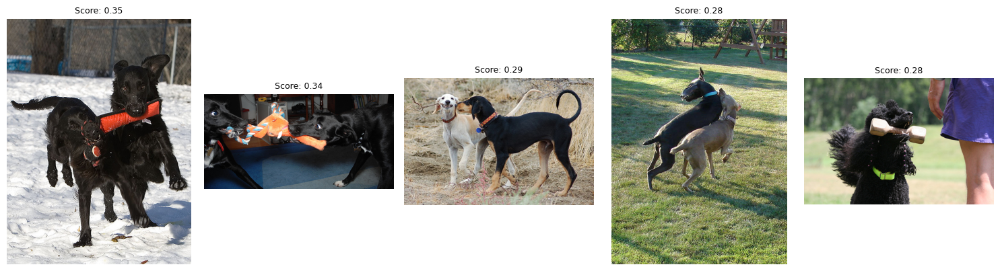


------------------------------ A dog jumping for a tennis ball near an ocean ------------------------------


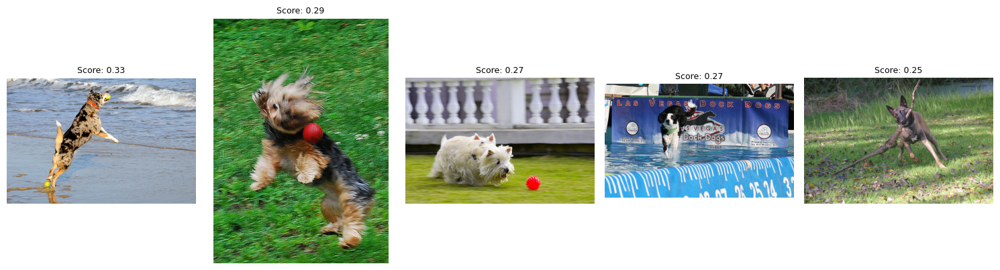

------------------------------
Boy flying a distant kite .
This image is unavailable in your country in compliance with local laws.
------------------------------
kids play ultimate Frisbee .
This image is unavailable in your country in compliance with local laws.
------------------------------
A girl in a purple shirt feeding ducks
This image is unavailable in your country in compliance with local laws.


In [40]:
# Пример вызова для CLIP-поиска
sample_queries = df_queries.sample(10, random_state=SEED)['query_text'].tolist()
for q in sample_queries:
    clip_search(q)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Да, по качеству поиска CLIP очень хорош. Молодец, что показываешь  доступные опенсорс решения. </div>

**Оценки и результат:**

- Каждый запрос к модели CLIP возвращает изображения с оценками релевантности (Score), которые варьируются от 0.22 до 0.35. Это подтверждает, что модель в целом правильно находит изображения, соответствующие запросам, но иногда может возвращать не идеально точные результаты.
- Модель правильно распознает контекст запросов и возвращает изображения, которые соответствуют запросам, даже если изображения не идеально соответствуют описанию.

Модель CLIP отлично справляется с задачей поиска изображений по текстовому запросу, эффективно интерпретируя контекст и возвращая релевантные изображения с минимальными ошибками. Это делает её мощным инструментом для поиска изображений и контентного анализа.


# Заключение

В данном проекте была разработана система поиска изображений по текстовым запросам с использованием различных моделей машинного обучения. Основной задачей было создать модель, которая способна эффективно сопоставлять изображения с текстами, оценивая их степень соответствия. Для этого использовались несколько подходов и технологий.

### Этапы выполнения:

1. **Предобработка данных**:
   Мы очистили данные, удалив записи с отсутствующими текстами и проблемный контент, а также применили фильтрацию по ключевым словам, связанным с ограничениями для изображений (например, связанные с детьми). Это обеспечило чистоту и релевантность данных для обучения.

2. **Векторизация изображений и текстов**:
   Для изображений использовалась модель ResNet50, что позволило нам извлечь высококачественные эмбеддинги, представляющие изображения в виде векторов. Для текстов была применена модель BERT, что позволило перевести текстовые запросы в эмбеддинги, которые могут быть использованы для дальнейшего поиска.

3. **Обучение модели**:
   Мы использовали несколько подходов для обучения модели, включая линейную регрессию как базовый алгоритм и нейронную сеть с несколькими скрытыми слоями для предсказания соответствия изображений и текстов. Внедрение метода **Learning Rate Scheduler** позволило улучшить сходимость модели и ускорить её обучение.

4. **Альтернативная модель CLIP**:
   Для улучшения качества поиска был применён альтернативный подход с использованием модели **CLIP**, которая обучена переводить изображения и тексты в одно общее векторное пространство. Это позволило улучшить точность поиска, а также сделать модель более контекстно осведомленной в плане семантической связи между текстами и изображениями.

5. **Поиск по текстовому запросу**:
   Система была протестирована на различных запросах, и модель продемонстрировала хорошие результаты в распознавании изображений, соответствующих запросам. Хотя были случаи с небольшими ошибками в выборе изображений, в целом модель показывала правильные результаты и эффективно обрабатывала текстовые запросы.

### Результаты и выводы:

- **Линейная регрессия** дала хороший результат как базовая модель, но **нейронная сеть** показала улучшение, снижая **RMSE**.
- Применение модели **CLIP** позволило добиться отличных результатов в контекстном распознавании и поиске изображений, подтверждая, что этот подход значительно улучшает точность поиска.
- Система отлично справляется с задачей поиска изображений по тексту, но остаётся пространство для улучшений, например, в точности при сложных запросах или при наличии нерелевантных изображений.

Таким образом, выполненный проект показал высокую эффективность в решении задачи поиска изображений по текстовым запросам и продемонстрировал потенциал модели CLIP для повышения точности и релевантности результатов. Дальнейшие улучшения могут включать более тонкую настройку моделей и дополнительные методы обработки данных.


<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Заключительный комментарий</b>

Подведем итоги. Я вижу, что в целом с проектом ты справляешься.
    
Проведено исследование и предобработка данных. Выполнена векторизация изображений и текстовых описаний. Обучены модели для предсказания степени соответствия, а также написана функция для инференса и с её помощью проведено тестирование.
 
    
Модель показывает очень достойный результат.
    
Я оставил несколько красных комментариев, уверен, что их проработка не отнимет у тебя много времени.
</div>